# PROSES EDA DATASET IMAGE

Proses **EDA** (*Exploratory Data Analysis*) merupakan proses awal yang digunakan untuk **menganalisa karakteristik data** yang akan digunakan untuk tahap pengolahan model. Proses EDA merupakan proses penting agar nantinya kita dapat menentukan teknik apa yang cocok untuk diterapkan pada tahap selanjutnya yaitu pada tahap *preprocessing* maupun *modeling* berdasarkan dari kondisi data yang dimiliki. Berikut beberapa tahap yang dilakukan pada proses EDA, diantaranya yaitu :

# 1. import dataset

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
from collections import defaultdict

# konfigurasi dataset
print("=== Isi /kaggle/input ===")
for root, dirs, files in os.walk('/kaggle/input'):
    level = root.replace('/kaggle/input', '').count(os.sep)
    if level > 5:
        continue
    indent = '  ' * level
    print(f'{indent}{os.path.basename(root)}/')

=== Isi /kaggle/input ===
input/
  datasets/
    salmaaida/
      plantdisease-dataset-corn-ori-process/
        plantdiseasdataset_corn_ori_process_pict/
          Corn_(maize)___Northern_Leaf_Blight/
          Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot/
          Corn_(maize)___Common_rust_/
          Corn_(maize)___healthy/


# 2. distribusi kelas pada dataset 

In [2]:
# path dataset 
DATASET_ROOT = Path('/kaggle/input/datasets/salmaaida/plantdisease-dataset-corn-ori-process/plantdiseasdataset_corn_ori_process_pict')

CLASS_MAP = {
    'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 'Gray Leaf Spot',
    'Corn_(maize)___Common_rust_'                       : 'Common Rust',
    'Corn_(maize)___Northern_Leaf_Blight'               : 'Northern Leaf Blight',
    'Corn_(maize)___healthy'                            : 'Healthy',
}
CLASS_COLORS = {
    'Gray Leaf Spot'      : '#e74c3c',
    'Common Rust'         : '#e67e22',
    'Northern Leaf Blight': '#2980b9',
    'Healthy'             : '#27ae60',
}
IMG_EXT = {'.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'}

print(f'Dataset path : {DATASET_ROOT}')
print(f'Path exists  : {DATASET_ROOT.exists()}')
if not DATASET_ROOT.exists():
    raise FileNotFoundError(f'Dataset tidak ditemukan: {DATASET_ROOT}')

# inventarisasi semua file 
records = []
for cls_folder in sorted(DATASET_ROOT.iterdir()):
    if not cls_folder.is_dir():
        continue
    label = CLASS_MAP.get(cls_folder.name, cls_folder.name)
    for img in sorted(cls_folder.iterdir()):
        if img.suffix not in IMG_EXT:
            continue
        records.append({
            'path'     : str(img),
            'filename' : img.name,
            'class'    : label,
            'extension': img.suffix.lower(),
        })

df = pd.DataFrame(records)
print(f'\nTotal file : {len(df):,}')
print(f'Label class  : {df["class"].nunique()}')
print(f'Distribusi kelas : {df["class"].value_counts().to_dict()}')

Dataset path : /kaggle/input/datasets/salmaaida/plantdisease-dataset-corn-ori-process/plantdiseasdataset_corn_ori_process_pict
Path exists  : True

Total file : 3,852
Label class  : 4
Distribusi kelas : {'Common Rust': 1192, 'Healthy': 1162, 'Northern Leaf Blight': 985, 'Gray Leaf Spot': 513}


  DISTRIBUSI LABEL CLASS
  Kelas                        Jumlah  Persentase
-------------------------------------------------------
  Common Rust                   1,192      30.9%  ███████████████
  Healthy                       1,162      30.2%  ███████████████
  Northern Leaf Blight            985      25.6%  ████████████
  Gray Leaf Spot                  513      13.3%  ██████
-------------------------------------------------------
  TOTAL                         3,852      100.0%


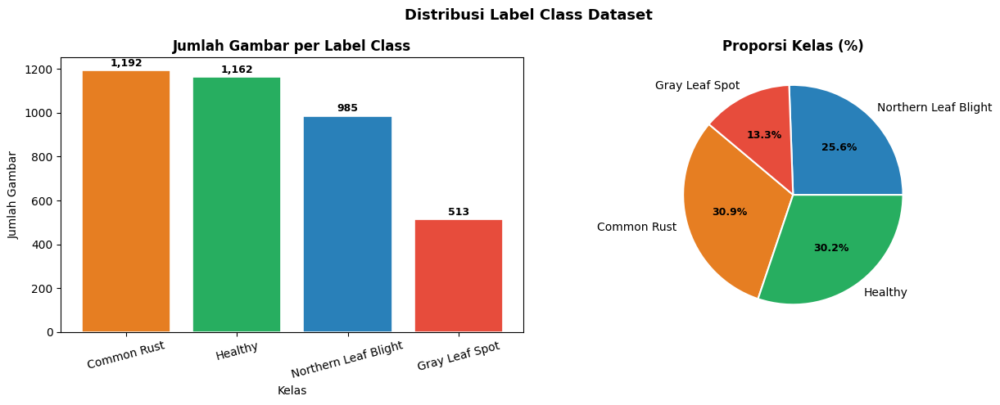


  Kelas terbanyak : Common Rust (1,192 gambar)
  Kelas tersedikit: Gray Leaf Spot (513 gambar)
  Rasio imbalance : 2.32x
  → Dataset TIDAK seimbang


In [3]:
# cek distribusi label class

class_counts = df['class'].value_counts().reset_index()
class_counts.columns = ['class', 'count']
class_counts['pct'] = (class_counts['count'] / len(df) * 100).round(1)
total = len(df)

# output tabel
print('=' * 55)
print('  DISTRIBUSI LABEL CLASS')
print('=' * 55)
print(f"  {'Kelas':<26} {'Jumlah':>8} {'Persentase':>11}")
print('-' * 55)
for _, r in class_counts.iterrows():
    bar = '█' * int(r['pct'] / 2)
    print(f"  {r['class']:<26} {int(r['count']):>8,} {r['pct']:>9.1f}%  {bar}")
print('-' * 55)
print(f"  {'TOTAL':<26} {total:>8,} {'100.0%':>11}")
print('=' * 55)

# output grafik / diagram
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Distribusi Label Class Dataset', fontsize=13, fontweight='bold')

colors = [CLASS_COLORS[c] for c in class_counts['class']]

# diagram batang
bars = axes[0].bar(class_counts['class'], class_counts['count'],
                   color=colors, edgecolor='white', linewidth=1.2)
axes[0].set_title('Jumlah Gambar per Label Class', fontweight='bold')
axes[0].set_xlabel('Kelas')
axes[0].set_ylabel('Jumlah Gambar')
axes[0].tick_params(axis='x', rotation=15)
for bar, val in zip(bars, class_counts['count']):
    axes[0].text(bar.get_x() + bar.get_width() / 2,
                 bar.get_height() + 10,
                 f'{val:,}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# diagram lingkaran
wedges, texts, autotexts = axes[1].pie(
    class_counts['count'],
    labels=class_counts['class'],
    colors=colors,
    autopct='%1.1f%%',
    startangle=140,
    wedgeprops=dict(edgecolor='white', linewidth=1.5)
)
for at in autotexts:
    at.set_fontsize(9)
    at.set_fontweight('bold')
axes[1].set_title('Proporsi Kelas (%)', fontweight='bold')

plt.tight_layout()
plt.show()

# perhitungan rasio
max_cls = class_counts.iloc[0]
min_cls = class_counts.iloc[-1]
rasio   = round(max_cls['count'] / min_cls['count'], 2)
print()
print(f'  Kelas terbanyak : {max_cls["class"]} ({max_cls["count"]:,} gambar)')
print(f'  Kelas tersedikit: {min_cls["class"]} ({min_cls["count"]:,} gambar)')
print(f'  Rasio imbalance : {rasio}x')
if rasio > 1.5:
    print('  → Dataset TIDAK seimbang')
else:
    print('  → Dataset relatif seimbang')

# 3. format file pada data

In [4]:
# cek format file

ext_counts = df['extension'].value_counts().reset_index()
ext_counts.columns = ['extension', 'count']
ext_counts['pct'] = (ext_counts['count'] / len(df) * 100).round(1)

print('=' * 45)
print('  DISTRIBUSI FORMAT FILE')
print('=' * 45)
print(f"  {'Ekstensi':<15} {'Jumlah':>8} {'Persen':>9}")
print('-' * 45)
for _, r in ext_counts.iterrows():
    print(f"  {r['extension']:<15} {int(r['count']):>8,} {r['pct']:>8.1f}%")
print('=' * 45)

# cek konsistensi mode warna (RGB vs grayscale vs RGBA) dan file corrupt
print('\n' + '=' * 60)
print('  HASIL ANALISA MODE WARNA PADA GAMBAR')
print('=' * 60)
sample = df.sample(min(200, len(df)), random_state=42)
mode_counts = defaultdict(int)
corrupt = []
for _, row in sample.iterrows():
    try:
        with Image.open(row['path']) as im:
            mode_counts[im.mode] += 1
    except Exception:
        corrupt.append(row['filename'])

print(f'\n  Mode warna yang ditemukan:')
for mode, cnt in sorted(mode_counts.items(), key=lambda x: -x[1]):
    print(f'    {mode:<10} : {cnt} file')
if corrupt:
    print(f'\n  File corrupt/tidak terbaca: {len(corrupt)}')
    for f in corrupt:
        print(f'    - {f}')
else:
    print(f'\n  Tidak ada file corrupt yang ditemukan.')

# cek file non-gambar
non_img = [f for f in DATASET_ROOT.rglob('*')
           if f.is_file() and f.suffix not in IMG_EXT]
print(f'\n  File non-gambar di dataset : {len(non_img)}')
if non_img:
    for f in non_img[:10]:
        print(f'    - {f.name}')

  DISTRIBUSI FORMAT FILE
  Ekstensi          Jumlah    Persen
---------------------------------------------
  .jpg               3,852    100.0%

  HASIL ANALISA MODE WARNA PADA GAMBAR

  Mode warna yang ditemukan:
    RGB        : 200 file

  Tidak ada file corrupt yang ditemukan.

  File non-gambar di dataset : 0


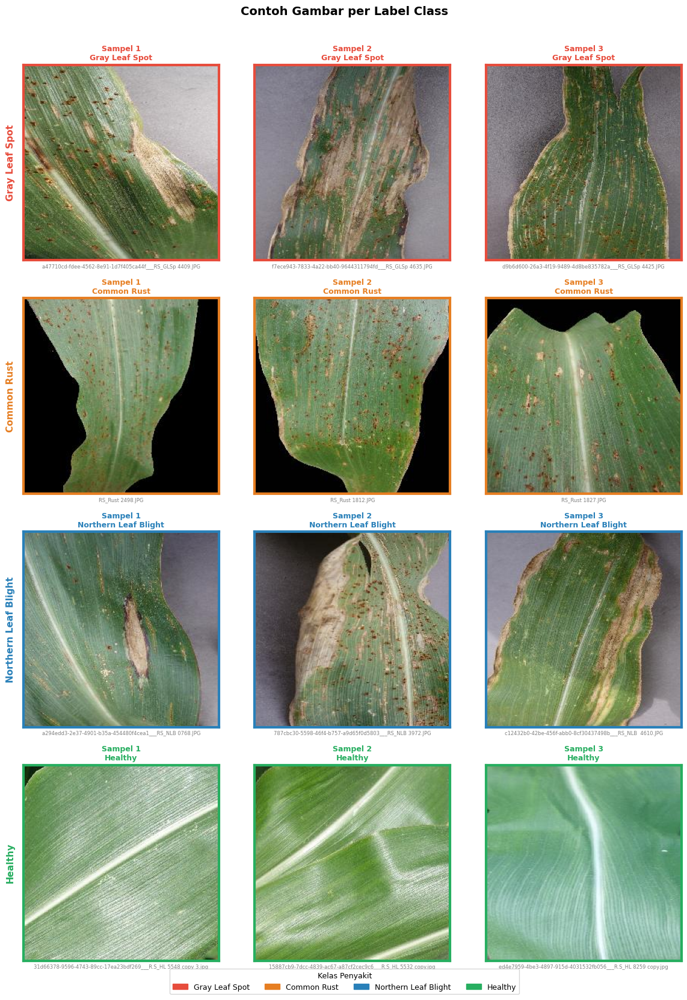

In [5]:
# contoh gambar per label class

N_SAMPLES = 3
classes   = list(CLASS_MAP.values())

fig, axes = plt.subplots(len(classes), N_SAMPLES,
                         figsize=(N_SAMPLES * 4, len(classes) * 4))
fig.suptitle('Contoh Gambar per Label Class', fontsize=14,
             fontweight='bold', y=1.01)

for i, cls in enumerate(classes):
    cls_files = df[df['class'] == cls]
    samples   = cls_files.sample(min(N_SAMPLES, len(cls_files)), random_state=42)
    color     = CLASS_COLORS[cls]

    for j in range(N_SAMPLES):
        ax = axes[i][j]

        if j < len(samples):
            row = samples.iloc[j]
            img = Image.open(row['path']).convert('RGB')
            ax.imshow(img)
            
            ax.set_title(
                f'Sampel {j + 1}\n{cls}',
                fontsize=9,
                fontweight='bold',
                color=color,
                pad=6
            )

            ax.set_xlabel(
                row['filename'],
                fontsize=6,
                color='gray',
                labelpad=4
            )

            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_edgecolor(color)
                spine.set_linewidth(3)

        else:
            ax.axis('off')
            continue

        ax.tick_params(left=False, labelleft=False,
                       bottom=False, labelbottom=False)

    axes[i][0].set_ylabel(
        cls,
        fontsize=11,
        fontweight='bold',
        color=color,
        rotation=90,
        labelpad=10
    )
    axes[i][0].yaxis.set_visible(True)
    axes[i][0].tick_params(left=False, labelleft=False)

legend_patches = [
    mpatches.Patch(color=CLASS_COLORS[cls], label=cls)
    for cls in classes
]
fig.legend(
    handles=legend_patches,
    loc='lower center',
    ncol=len(classes),
    fontsize=9,
    frameon=True,
    title='Kelas Penyakit',
    title_fontsize=9,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout()
plt.show()

# 4. keseragaman ukuran gambar


  STATISTIK UKURAN GAMBAR PER LABEL CLASS
  Kelas                           Min W×H      Max W×H    Dominan W×H
-----------------------------------------------------------------
  Gray Leaf Spot             256×  256    256×256   256×  256
  Common Rust                256×  256    256×256   256×  256
  Northern Leaf Blight       256×  256    256×256   256×  256
  Healthy                    256×  256    256×256   256×  256


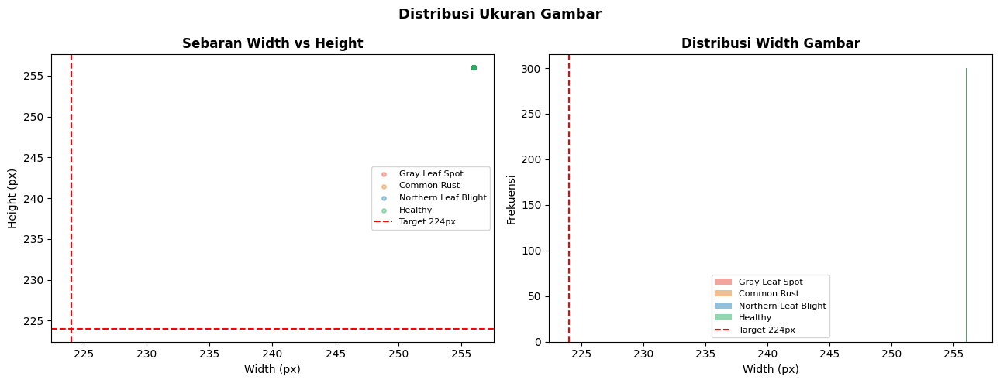


  HASIL ANALISA KESERAGAMAN UKURAN GAMBAR
  Jumlah ukuran unik   : 1
  Width  rata-rata     : 256 px
  Height rata-rata     : 256 px
  → Semua gambar sudah seragam


In [6]:
# cek ukuran gambar

# membaca dimensi gambar (sampling 300 file per kelas)
sizes = []
for cls in classes:
    cls_files = df[df['class'] == cls]
    sample    = cls_files.sample(min(300, len(cls_files)), random_state=42)
    for _, row in sample.iterrows():
        try:
            with Image.open(row['path']) as im:
                w, h = im.size
                sizes.append({'class': cls, 'width': w, 'height': h,
                               'aspect': round(w / h, 3)})
        except Exception:
            pass

df_sizes = pd.DataFrame(sizes)

# statistik ukuran gambar per label class
print('\n' + '=' * 65)
print('  STATISTIK UKURAN GAMBAR PER LABEL CLASS')
print('=' * 65)
print(f"  {'Kelas':<26} {'Min W×H':>12} {'Max W×H':>12} {'Dominan W×H':>14}")
print('-' * 65)
for cls in classes:
    s = df_sizes[df_sizes['class'] == cls]
    min_w, min_h = s['width'].min(), s['height'].min()
    max_w, max_h = s['width'].max(), s['height'].max()
    dom_w = int(s['width'].mode()[0])
    dom_h = int(s['height'].mode()[0])
    print(f"  {cls:<26} {min_w}×{min_h:>5} {max_w:>6}×{max_h:<5} {dom_w}×{dom_h:>5}")
print('=' * 65)

# hasil dalam bentuk visualisasi grafik
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Distribusi Ukuran Gambar', fontsize=13, fontweight='bold')

for cls in classes:
    s = df_sizes[df_sizes['class'] == cls]
    axes[0].scatter(s['width'], s['height'], alpha=0.4, s=15,
                    color=CLASS_COLORS[cls], label=cls)
axes[0].axvline(224, color='red', linestyle='--', linewidth=1.5, label='Target 224px')
axes[0].axhline(224, color='red', linestyle='--', linewidth=1.5)
axes[0].set_title('Sebaran Width vs Height', fontweight='bold')
axes[0].set_xlabel('Width (px)')
axes[0].set_ylabel('Height (px)')
axes[0].legend(fontsize=8)

for cls in classes:
    s = df_sizes[df_sizes['class'] == cls]
    axes[1].hist(s['width'], bins=30, alpha=0.5,
                 color=CLASS_COLORS[cls], label=cls)
axes[1].axvline(224, color='red', linestyle='--', linewidth=1.5, label='Target 224px')
axes[1].set_title('Distribusi Width Gambar', fontweight='bold')
axes[1].set_xlabel('Width (px)')
axes[1].set_ylabel('Frekuensi')
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

unique_sizes = df_sizes.groupby(['width', 'height']).size()
print('\n' + '=' * 60)
print('  HASIL ANALISA KESERAGAMAN UKURAN GAMBAR')
print('=' * 60)
print(f'  Jumlah ukuran unik   : {len(unique_sizes)}')
print(f'  Width  rata-rata     : {df_sizes["width"].mean():.0f} px')
print(f'  Height rata-rata     : {df_sizes["height"].mean():.0f} px')
if len(unique_sizes) > 1:
    print('  → Ukuran gambar TIDAK seragam')
else:
    print('  → Semua gambar sudah seragam')

# 5. kondisi background gambar

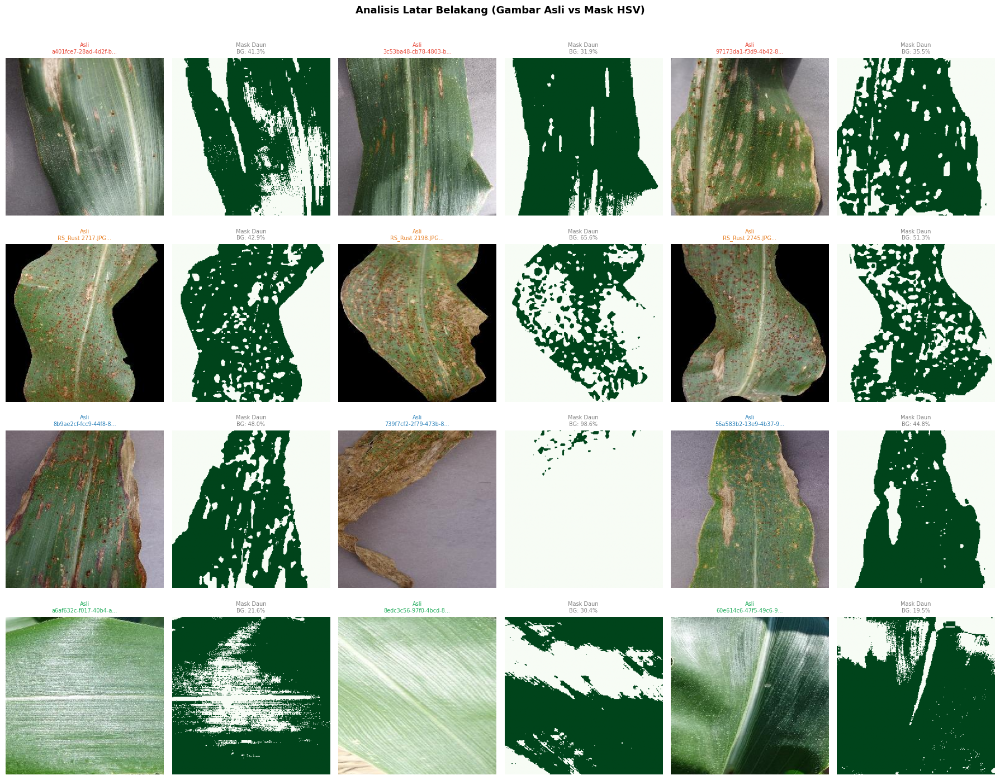


  RATA-RATA PROPORSI LATAR BELAKANG
  Gray Leaf Spot             : 36.2%
  Common Rust                : 53.3%
  Northern Leaf Blight       : 63.8%
  Healthy                    : 23.8%

  Rata-rata background keseluruhan : 44.3%
  → Proporsi background cukup besar


In [7]:
# cek background gambar

# menganalisis latar belakang gambar (sampling 3 per kelas)

N_SAMPLE_BG = 3
fig, axes = plt.subplots(len(classes), N_SAMPLE_BG * 2,
                         figsize=(N_SAMPLE_BG * 2 * 3, len(classes) * 3.5))
fig.suptitle('Analisis Latar Belakang (Gambar Asli vs Mask HSV)',
             fontsize=13, fontweight='bold', y=1.01)

bg_stats = []
for i, cls in enumerate(classes):
    cls_files = df[df['class'] == cls]
    samples   = cls_files.sample(min(N_SAMPLE_BG, len(cls_files)), random_state=7)
    color     = CLASS_COLORS[cls]

    for j, (_, row) in enumerate(samples.iterrows()):
        img_bgr = cv2.imread(row['path'])
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

        # Mask daun (hijau) via HSV
        lower = np.array([25, 30, 30])
        upper = np.array([90, 255, 255])
        mask  = cv2.inRange(img_hsv, lower, upper)

        total_px   = mask.size
        leaf_px    = np.count_nonzero(mask)
        bg_px      = total_px - leaf_px
        bg_pct     = round(bg_px / total_px * 100, 1)
        bg_stats.append({'class': cls, 'bg_pct': bg_pct})

        col_img  = j * 2
        col_mask = j * 2 + 1

        axes[i][col_img].imshow(img_rgb)
        axes[i][col_img].axis('off')
        axes[i][col_img].set_title(f'Asli\n{row["filename"][:20]}...',
                                    fontsize=7, color=color)
        for spine in axes[i][col_img].spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(color)
            spine.set_linewidth(2)

        axes[i][col_mask].imshow(mask, cmap='Greens')
        axes[i][col_mask].axis('off')
        axes[i][col_mask].set_title(f'Mask Daun\nBG: {bg_pct}%',
                                     fontsize=7, color='gray')

plt.tight_layout()
plt.show()

# statistik rata-rata background per label class
df_bg = pd.DataFrame(bg_stats)
print('\n' + '=' * 45)
print('  RATA-RATA PROPORSI LATAR BELAKANG')
print('=' * 45)
for cls in classes:
    mean_bg = df_bg[df_bg['class'] == cls]['bg_pct'].mean()
    print(f'  {cls:<26} : {mean_bg:.1f}%')
print('=' * 45)
overall = df_bg['bg_pct'].mean()
print()
print(f'  Rata-rata background keseluruhan : {overall:.1f}%')
if overall > 20:
    print('  → Proporsi background cukup besar')
else:
    print('  → Background relatif minimal')

# 6. distribusi warna gambar

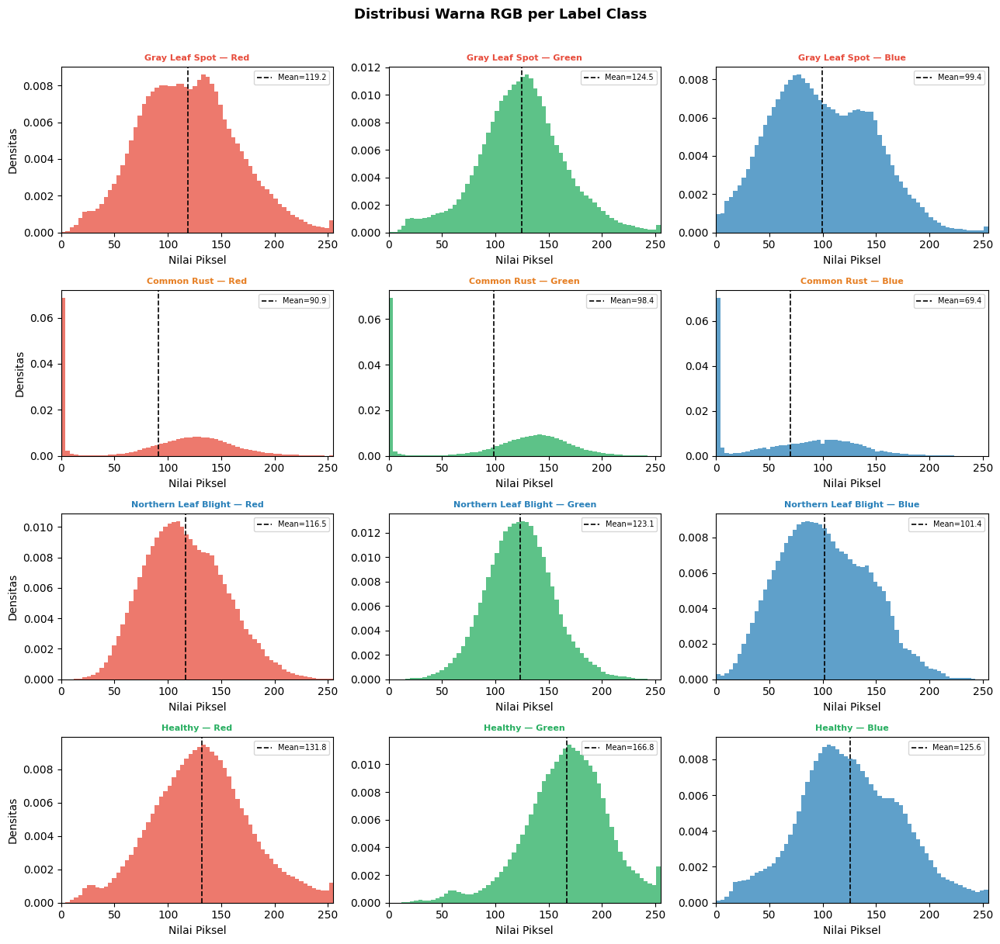


  HASIL STATISTIK MEAN & STD per CHANNEL RGB
                        mean                    std              
channel                 Blue   Green     Red   Blue  Green    Red
class                                                            
Common Rust            69.43   98.44   90.88  55.16  68.19  64.93
Gray Leaf Spot         99.42  124.53  119.18  46.99  40.30  45.13
Healthy               125.58  166.77  131.76  47.55  38.70  45.37
Northern Leaf Blight  101.39  123.13  116.51  41.88  31.26  37.64


In [8]:
# cek distribusi warna gambar

# menghitung distribusi warna RGB (sampling 100 per kelas)

fig, axes = plt.subplots(len(classes), 3,
                         figsize=(13, len(classes) * 3))
fig.suptitle('Distribusi Warna RGB per Label Class',
             fontsize=13, fontweight='bold', y=1.01)

channel_names  = ['Red', 'Green', 'Blue']
channel_colors = ['#e74c3c', '#27ae60', '#2980b9']
global_means, global_stds = [], []

for i, cls in enumerate(classes):
    cls_files  = df[df['class'] == cls]
    sample     = cls_files.sample(min(100, len(cls_files)), random_state=42)
    all_pixels = [[], [], []]

    for _, row in sample.iterrows():
        try:
            img = np.array(Image.open(row['path']).convert('RGB'))
            for ch in range(3):
                all_pixels[ch].extend(img[:, :, ch].flatten().tolist())
        except Exception:
            pass

    for ch in range(3):
        px = np.array(all_pixels[ch])
        axes[i][ch].hist(px, bins=64, color=channel_colors[ch],
                         alpha=0.75, density=True)
        axes[i][ch].axvline(px.mean(), color='black',
                            linestyle='--', linewidth=1.2,
                            label=f'Mean={px.mean():.1f}')
        axes[i][ch].set_title(f'{cls} — {channel_names[ch]}',
                               fontsize=8, fontweight='bold',
                               color=CLASS_COLORS[cls])
        axes[i][ch].set_xlim(0, 255)
        axes[i][ch].legend(fontsize=7)
        axes[i][ch].set_xlabel('Nilai Piksel')
        if ch == 0:
            axes[i][ch].set_ylabel('Densitas')

        global_means.append({'class': cls, 'channel': channel_names[ch],
                              'mean': round(px.mean(), 2),
                              'std' : round(px.std(), 2)})

plt.tight_layout()
plt.show()

# visualisasi bentuk tabel
df_rgb = pd.DataFrame(global_means)
pivot  = df_rgb.pivot_table(index='class', columns='channel',
                             values=['mean', 'std']).round(2)
print('\n' + '=' * 60)
print('  HASIL STATISTIK MEAN & STD per CHANNEL RGB')
print('=' * 60)
print(pivot.to_string())

# 7. analisis noise

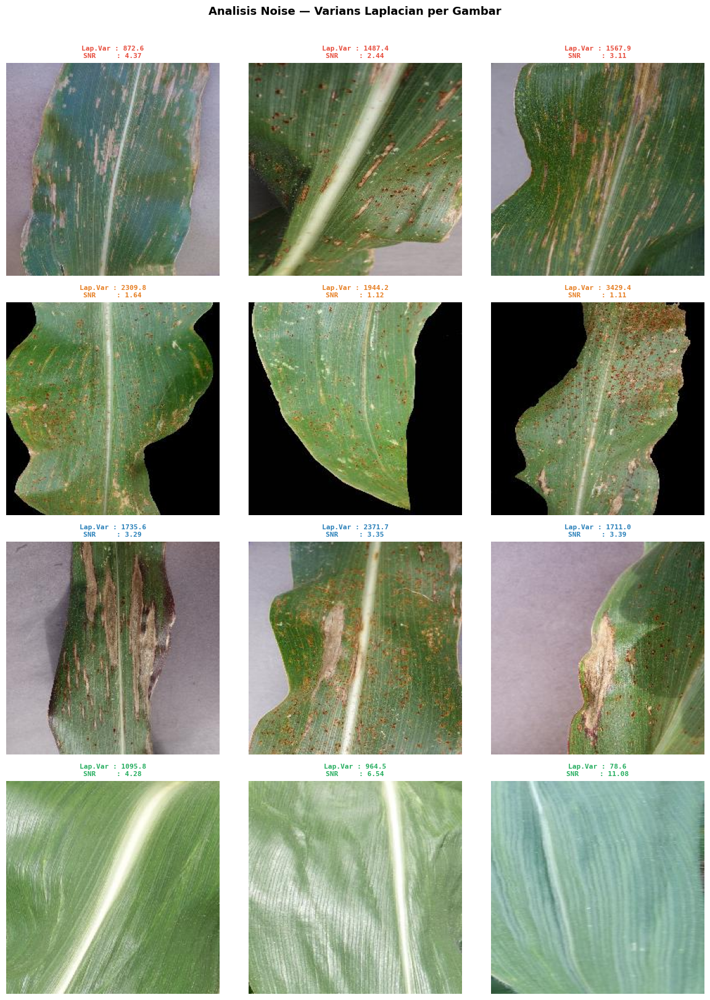


  RINGKASAN NOISE PER LABEL CLASS
  Kelas                        Lap.Var Mean   SNR Mean
------------------------------------------------------------
  Gray Leaf Spot                    1309.30       3.31
  Common Rust                       2561.14       1.29
  Northern Leaf Blight              1939.41       3.34
  Healthy                            712.98       7.30

  HASIL ANALISIS NOISE
  Rata-rata Laplacian Variance keseluruhan : 1630.71
  → Gambar relatif tajam, noise minimal.


In [9]:
# cek noise pada gambar

# menganalisis tingkat noise gambar (sampling 3 per kelas)

def estimate_noise_laplacian(img_gray: np.ndarray) -> float:
    """Estimasi noise via varians Laplacian — semakin rendah = semakin blur/noisy."""
    return round(cv2.Laplacian(img_gray, cv2.CV_64F).var(), 2)

def estimate_snr(img_gray: np.ndarray) -> float:
    """Signal-to-Noise Ratio sederhana."""
    mean = img_gray.mean()
    std  = img_gray.std()
    return round(mean / std, 2) if std > 0 else 0.0

N_SAMPLE_NOISE = 3
noise_stats = []

fig, axes = plt.subplots(len(classes), N_SAMPLE_NOISE,
                         figsize=(N_SAMPLE_NOISE * 4, len(classes) * 4))
fig.suptitle('Analisis Noise — Varians Laplacian per Gambar',
             fontsize=13, fontweight='bold', y=1.01)

for i, cls in enumerate(classes):
    cls_files = df[df['class'] == cls]
    samples   = cls_files.sample(min(N_SAMPLE_NOISE, len(cls_files)), random_state=99)
    color     = CLASS_COLORS[cls]

    for j, (_, row) in enumerate(samples.iterrows()):
        img_bgr  = cv2.imread(row['path'])
        img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        lap_var = estimate_noise_laplacian(img_gray)
        snr     = estimate_snr(img_gray)
        noise_stats.append({'class': cls, 'lap_var': lap_var, 'snr': snr})

        ax = axes[i][j]
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(
            f'Lap.Var : {lap_var:.1f}\nSNR     : {snr:.2f}',
            fontsize=8, color=color, fontweight='bold',
            fontfamily='monospace'
        )
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(color)
            spine.set_linewidth(2)

    axes[i][0].set_ylabel(cls, fontsize=9, fontweight='bold',
                           color=color, rotation=90, labelpad=8)
    axes[i][0].yaxis.set_visible(True)
    axes[i][0].tick_params(left=False, labelleft=False)

plt.tight_layout()
plt.show()

# visualisasi bentuk tabel
df_noise = pd.DataFrame(noise_stats)
print('\n' + '=' * 60)
print('  RINGKASAN NOISE PER LABEL CLASS')
print('=' * 60)
print(f"  {'Kelas':<26} {'Lap.Var Mean':>14} {'SNR Mean':>10}")
print('-' * 60)
for cls in classes:
    s = df_noise[df_noise['class'] == cls]
    print(f"  {cls:<26} {s['lap_var'].mean():>14.2f} {s['snr'].mean():>10.2f}")
print('=' * 60)

overall_lap = df_noise['lap_var'].mean()
print('\n' + '=' * 60)
print('  HASIL ANALISIS NOISE')
print('=' * 60)
print(f'  Rata-rata Laplacian Variance keseluruhan : {overall_lap:.2f}')
if overall_lap < 100:
    print('  → Gambar cenderung blur/noisy.')
else:
    print('  → Gambar relatif tajam, noise minimal.')

# 8. analisis kualitas gambar


  RINGKASAN KUALITAS GAMBAR PER LABEL CLASS
  Kelas                       Brightness   Contrast   Sharpness   Bermasalah
---------------------------------------------------------------------------
  Gray Leaf Spot                   50.7       38.0      2968.9     68 (34.0%)
  Common Rust                      39.0       63.0      2900.4     24 (12.0%)
  Northern Leaf Blight             50.3       32.0      1741.3     85 (42.5%)
  Healthy                          64.0       32.1      1178.3    124 (62.0%)

  Total gambar bermasalah : 301 dari 800 (37.6%)

  JENIS MASALAH PADA GAMBAR
    kontras rendah       :   245 gambar (30.6%)
    overexposed          :    57 gambar (7.1%)
    gelap                :    26 gambar (3.2%)
    blur                 :    21 gambar (2.6%)


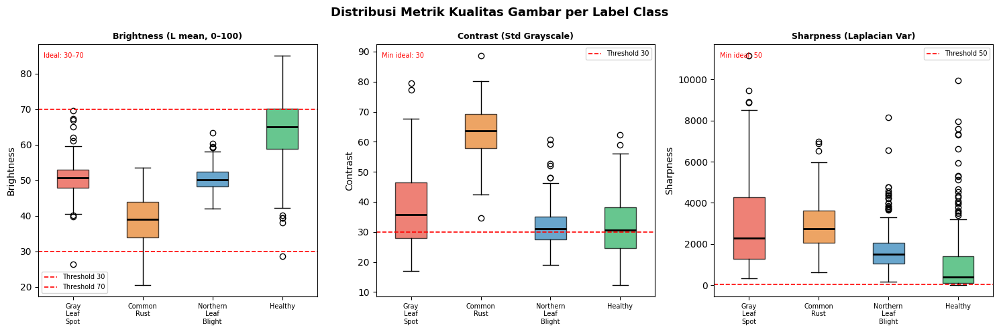

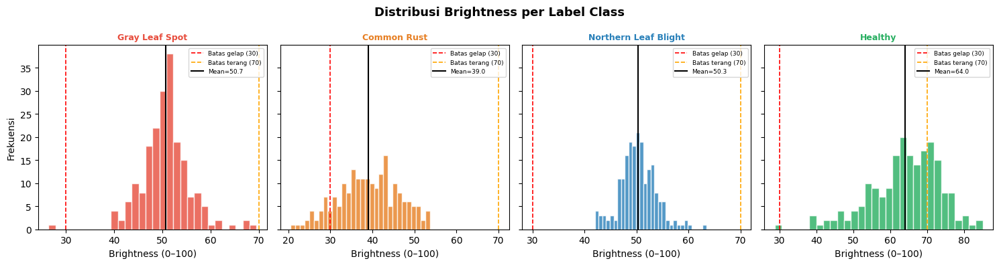

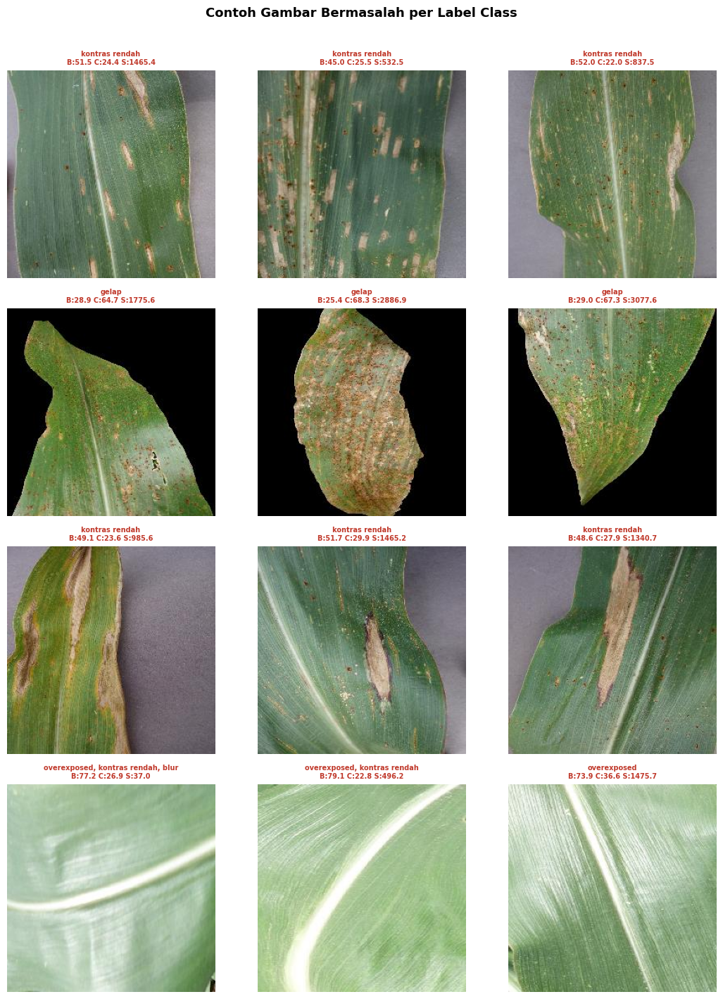


  HASIL RATA-RATA KUALITAS GAMBAR
  Rata-rata brightness keseluruhan : 51.0 / 100
  Rata-rata contrast keseluruhan   : 41.3
  Gambar dengan masalah kualitas   : 37.6%


In [10]:
# cek kualitas gambar

# menganalisis kualitas gambar (sampling 200 per kelas)')

def analyze_image_quality(img_path: str) -> dict:
    """
    Hitung metrik kualitas gambar:
    - brightness : mean channel L pada LAB (0–100)
    - contrast   : std piksel grayscale
    - sharpness  : varians Laplacian
    """
    img_bgr  = cv2.imread(img_path)
    img_lab  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    brightness = img_lab[:, :, 0].mean()          # channel L (0–255 di OpenCV)
    brightness_norm = brightness / 255 * 100       # normalisasi ke 0–100
    contrast   = img_gray.std()
    sharpness  = cv2.Laplacian(img_gray, cv2.CV_64F).var()

    return {
        'brightness': round(brightness_norm, 2),
        'contrast'  : round(contrast, 2),
        'sharpness' : round(sharpness, 2),
    }

# metriks kualitas
quality_records = []
for cls in classes:
    cls_files = df[df['class'] == cls]
    sample    = cls_files.sample(min(200, len(cls_files)), random_state=42)
    for _, row in sample.iterrows():
        try:
            metrics = analyze_image_quality(row['path'])
            metrics['class']    = cls
            metrics['filename'] = row['filename']
            metrics['path']     = row['path']
            quality_records.append(metrics)
        except Exception:
            pass

df_quality = pd.DataFrame(quality_records)

# ── Threshold klasifikasi kualitas ────────────────────────
# Brightness  : terlalu gelap < 30, terlalu terang > 70
# Contrast    : rendah < 30
# Sharpness   : blur < 50

def flag_quality(row):
    issues = []
    if row['brightness'] < 30:
        issues.append('gelap')
    elif row['brightness'] > 70:
        issues.append('overexposed')
    if row['contrast'] < 30:
        issues.append('kontras rendah')
    if row['sharpness'] < 50:
        issues.append('blur')
    return ', '.join(issues) if issues else 'baik'

df_quality['issue'] = df_quality.apply(flag_quality, axis=1)
df_quality['has_issue'] = df_quality['issue'] != 'baik'

# tabel visualisasi kualitas gambar
print('\n' + '=' * 60)
print('  RINGKASAN KUALITAS GAMBAR PER LABEL CLASS')
print('=' * 60)
print(f"  {'Kelas':<26} {'Brightness':>11} {'Contrast':>10} "
      f"{'Sharpness':>11} {'Bermasalah':>12}")
print('-' * 75)
for cls in classes:
    s = df_quality[df_quality['class'] == cls]
    n_issue  = s['has_issue'].sum()
    pct      = round(n_issue / len(s) * 100, 1)
    print(
        f"  {cls:<26}"
        f" {s['brightness'].mean():>10.1f}"
        f" {s['contrast'].mean():>10.1f}"
        f" {s['sharpness'].mean():>11.1f}"
        f" {n_issue:>6} ({pct}%)"
    )
print('=' * 75)

total_issue = df_quality['has_issue'].sum()
total_pct   = round(total_issue / len(df_quality) * 100, 1)
print(f'\n  Total gambar bermasalah : {total_issue} dari '
      f'{len(df_quality)} ({total_pct}%)')

# jenis masalah pada gambar
print('\n' + '=' * 60)
print('  JENIS MASALAH PADA GAMBAR')
print('=' * 60)
issue_flat = []
for issues in df_quality[df_quality['has_issue']]['issue']:
    for iss in issues.split(', '):
        issue_flat.append(iss.strip())

from collections import Counter
issue_counts = Counter(issue_flat)
for iss, cnt in issue_counts.most_common():
    pct = round(cnt / len(df_quality) * 100, 1)
    print(f'    {iss:<20} : {cnt:>5} gambar ({pct}%)')

# visualisasi boxplot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Distribusi Metrik Kualitas Gambar per Label Class',
             fontsize=13, fontweight='bold')

metrics_info = [
    ('brightness', 'Brightness (L mean, 0–100)',  [30, 70],  'Ideal: 30–70'),
    ('contrast',   'Contrast (Std Grayscale)',     [30],      'Min ideal: 30'),
    ('sharpness',  'Sharpness (Laplacian Var)',    [50],      'Min ideal: 50'),
]

for ax, (metric, title, thresholds, note) in zip(axes, metrics_info):
    data_per_cls = [
        df_quality[df_quality['class'] == cls][metric].values
        for cls in classes
    ]
    bp = ax.boxplot(
        data_per_cls,
        patch_artist=True,
        medianprops=dict(color='black', linewidth=2)
    )
    for patch, cls in zip(bp['boxes'], classes):
        patch.set_facecolor(CLASS_COLORS[cls])
        patch.set_alpha(0.7)

    for thr in thresholds:
        ax.axhline(thr, color='red', linestyle='--',
                   linewidth=1.2, label=f'Threshold {thr}')

    ax.set_title(title, fontweight='bold', fontsize=9)
    ax.set_xticks(range(1, len(classes) + 1))
    ax.set_xticklabels([c.replace(' ', '\n') for c in classes], fontsize=7)
    ax.set_ylabel(metric.capitalize())
    ax.legend(fontsize=7)
    ax.annotate(note, xy=(0.02, 0.97), xycoords='axes fraction',
                fontsize=7, color='red', va='top')

plt.tight_layout()
plt.show()

# visualisasi histrogram
fig, axes = plt.subplots(1, len(classes), figsize=(15, 4), sharey=True)
fig.suptitle('Distribusi Brightness per Label Class',
             fontsize=13, fontweight='bold')

for ax, cls in zip(axes, classes):
    s     = df_quality[df_quality['class'] == cls]
    color = CLASS_COLORS[cls]
    ax.hist(s['brightness'], bins=30, color=color, alpha=0.8, edgecolor='white')
    ax.axvline(30, color='red',    linestyle='--', linewidth=1.2, label='Batas gelap (30)')
    ax.axvline(70, color='orange', linestyle='--', linewidth=1.2, label='Batas terang (70)')
    ax.axvline(s['brightness'].mean(), color='black',
               linestyle='-', linewidth=1.5,
               label=f'Mean={s["brightness"].mean():.1f}')
    ax.set_title(cls, fontweight='bold', color=color, fontsize=9)
    ax.set_xlabel('Brightness (0–100)')
    if ax == axes[0]:
        ax.set_ylabel('Frekuensi')
    ax.legend(fontsize=6.5)

plt.tight_layout()
plt.show()

# contoh gambar yang bermasalah
fig_rows = []
for cls in classes:
    issues = df_quality[
        (df_quality['class'] == cls) & (df_quality['has_issue'])
    ]
    if not issues.empty:
        fig_rows.append(issues.sample(min(3, len(issues)), random_state=42))

if fig_rows:
    n_rows = len(fig_rows)
    fig, axes = plt.subplots(n_rows, 3, figsize=(11, n_rows * 3.5))
    if n_rows == 1:
        axes = [axes]
    fig.suptitle('Contoh Gambar Bermasalah per Label Class',
                 fontsize=13, fontweight='bold', y=1.01)

    for i, sample_df in enumerate(fig_rows):
        cls   = sample_df.iloc[0]['class']
        color = CLASS_COLORS[cls]
        for j in range(3):
            ax = axes[i][j]
            if j < len(sample_df):
                row = sample_df.iloc[j]
                img = Image.open(row['path']).convert('RGB')
                ax.imshow(img)
                ax.set_title(
                    f"{row['issue']}\n"
                    f"B:{row['brightness']:.1f} "
                    f"C:{row['contrast']:.1f} "
                    f"S:{row['sharpness']:.1f}",
                    fontsize=7, color='#c0392b', fontweight='bold'
                )
                for spine in ax.spines.values():
                    spine.set_visible(True)
                    spine.set_edgecolor(color)
                    spine.set_linewidth(2)
            else:
                ax.axis('off')
                continue
            ax.axis('off')
        axes[i][0].set_ylabel(cls, fontsize=9, fontweight='bold',
                               color=color, rotation=90, labelpad=8)
        axes[i][0].yaxis.set_visible(True)
        axes[i][0].tick_params(left=False, labelleft=False)

    plt.tight_layout()
    plt.show()
else:
    print('Tidak ada gambar yang bermasalah')

# hasil rata-rata kualitas gambar
print('\n' + '=' * 60)
print('  HASIL RATA-RATA KUALITAS GAMBAR')
print('=' * 60)
overall_brightness = df_quality['brightness'].mean()
overall_contrast   = df_quality['contrast'].mean()
print(f'  Rata-rata brightness keseluruhan : {overall_brightness:.1f} / 100')
print(f'  Rata-rata contrast keseluruhan   : {overall_contrast:.1f}')
print(f'  Gambar dengan masalah kualitas   : {total_pct}%')